In [2]:
import nlpaug.augmenter.audio as naa
from nlpaug.util.audio.visualizer import AudioVisualizer
import IPython.display as ipd

import librosa
import librosa.display
import soundfile as sf

import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import random

In [3]:
data_split_dir = './datasets/KAGGLE/AUDIO/data_split/'
new_fake = data_split_dir + 'FAKE/'
new_real = data_split_dir + 'REAL/'

aug_fake = data_split_dir + 'aug_fake/'
aug_real = data_split_dir + 'aug_real/'

In [4]:
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
np.random.seed(SEED)
random.seed(SEED)

In [5]:
fileName = 'linus-original_clip_0.wav';
audio, sr = librosa.load(new_real+fileName)

In [6]:
def simulateAug(augModel, audio, sr, flag) :
    augmented_data = augModel.augment(audio)

    librosa.display.waveshow(np.array(augmented_data), sr=sr, alpha=0.5, color="blue")
    librosa.display.waveshow(audio, sr=sr, alpha=0.25, color="red")

    display('origin', ipd.Audio(audio, rate=sr))
    display(flag, ipd.Audio(augmented_data, rate=sr))

    plt.tight_layout()
    plt.show()

    return augmented_data

'origin'

'crop'

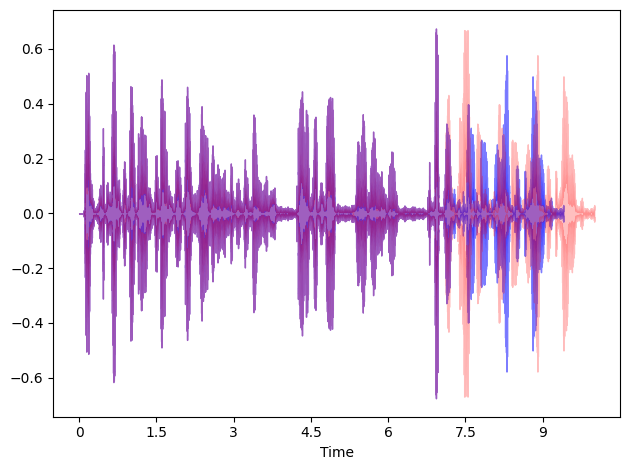

In [96]:
# crop 
cropAug = naa.CropAug(sampling_rate=sr)
cropAudio = simulateAug(cropAug, audio, sr, 'crop')

In [99]:
output_file = os.path.join(aug_real, f'{fileName}_crop.wav')
sf.write(output_file, np.ravel(cropAudio), sr)

'origin'

'loudness'

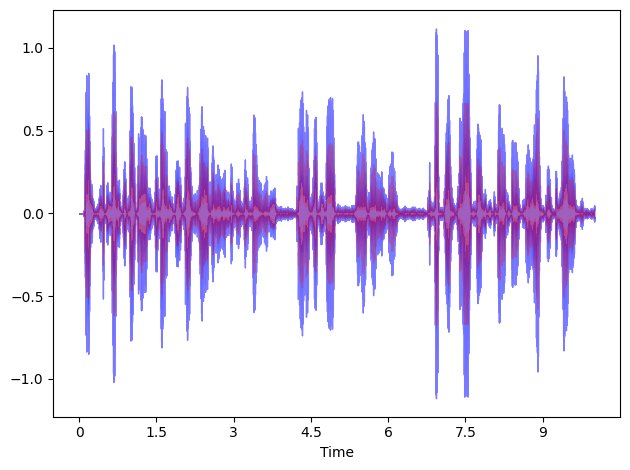

[array([-4.6481378e-07,  1.1642434e-06, -5.2093947e-06, ...,
        -2.9598761e-02, -2.7344704e-02, -2.7790140e-02], dtype=float32)]

In [17]:
# loudness 
loudnessAug = naa.LoudnessAug(zone=(0.0, 1.0))
simulateAug(loudnessAug, audio, sr, 'loudness')

'origin'

'mask'

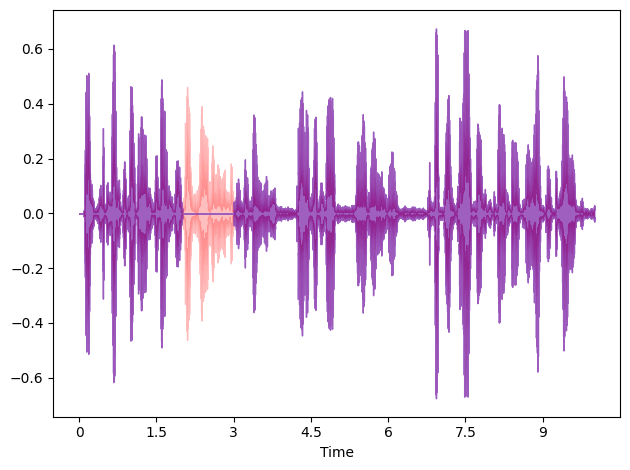

./datasets/KAGGLE/AUDIO/data_split/aug_real/linus-original_clip_0_mask_sample.wav


In [7]:
# mask 
maskAug = naa.MaskAug(sampling_rate=sr, zone=(0.2, 0.3), coverage=1, mask_with_noise=False)
mask_audio = simulateAug(maskAug, audio, sr, 'mask')

# output_file = os.path.join(aug_real, f'{os.path.splitext(fileName)[0]}_mask_sample.wav')
# print(output_file)
# sf.write(output_file, np.ravel(mask_audio), sr)

'origin'

'noise'

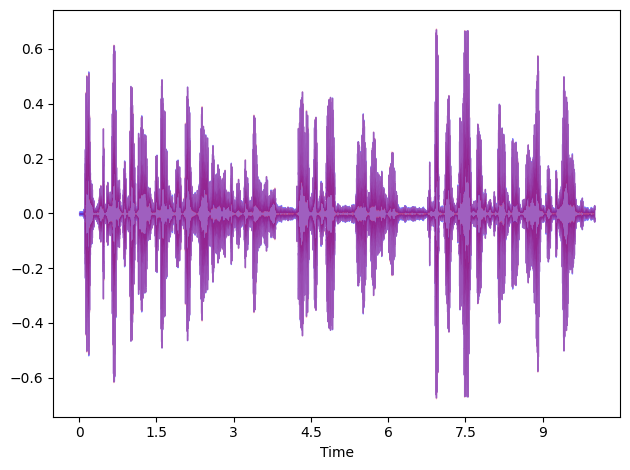

./datasets/KAGGLE/AUDIO/data_split/aug_real/linus-original_clip_0_w_noise_sample.wav


In [8]:
# noise 
# color : ‘white’, ‘pink’, ‘red’, ‘brown’, ‘brownian’, ‘blue’, ‘azure’, ‘violet’, ‘purple’ and ‘random’
noiseAug = naa.NoiseAug(zone=(0.0, 1.0), color='white')
w_noise_audio = simulateAug(noiseAug, audio, sr, 'noise')

# output_file = os.path.join(aug_real, f'{os.path.splitext(fileName)[0]}_w_noise_sample.wav')
# print(output_file)
# sf.write(output_file, np.ravel(w_noise_audio), sr)

# noiseAug = naa.NoiseAug(zone=(0.0, 1.0), color='brown')
# simulateAug(noiseAug, audio, sr, 'noise')

'origin'

'pitch'

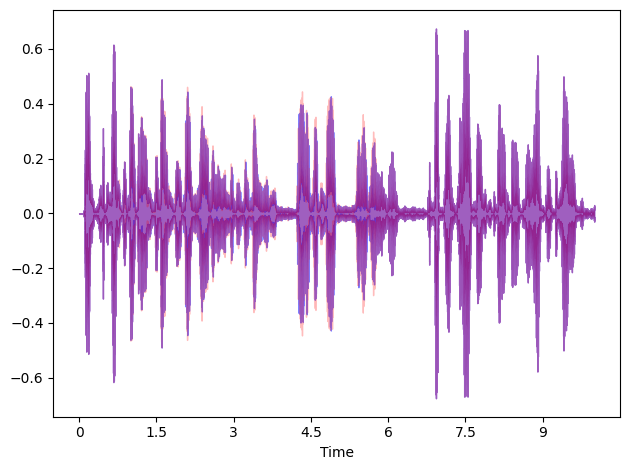

[array([-2.8048873e-07,  7.0255476e-07, -3.1435738e-06, ...,
        -1.7861173e-02, -1.6500976e-02, -1.6769772e-02], dtype=float32)]

In [44]:
# pitch 
pitchAug = naa.PitchAug(sampling_rate=sr, zone=(0.0, 1), coverage=0.5, factor=(0, -0.1))
simulateAug(pitchAug, audio, sr, 'pitch')

'origin'

'shift'

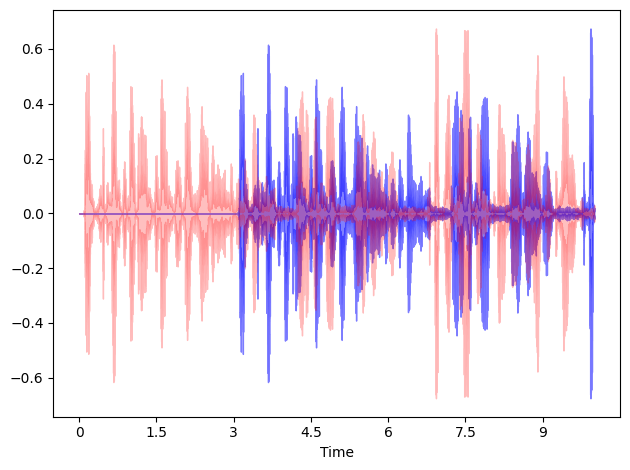

In [76]:
# shift 
shiftAug = naa.ShiftAug(sampling_rate=sr)
simulateAug(shiftAug, audio, sr, 'shift')

'origin'

'speed'

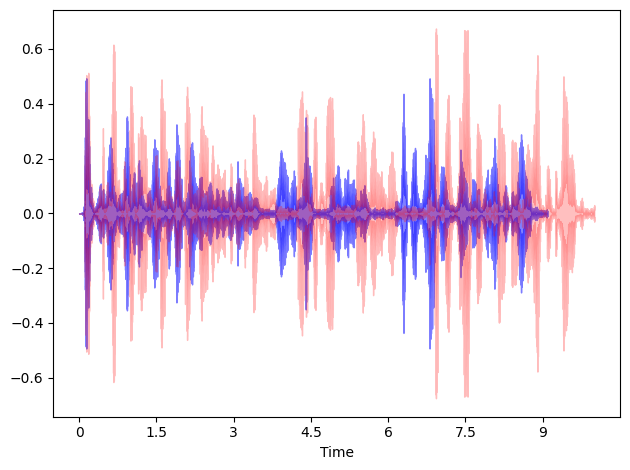

./datasets/KAGGLE/AUDIO/data_split/aug_real/linus-original_clip_0_speed_up_sample.wav


In [9]:
# speed up
speedAug = naa.SpeedAug(zone=(0,1), coverage=1, factor=(1.1, 1.1))
speed_up_audio = simulateAug(speedAug, audio, sr, 'speed')

# output_file = os.path.join(aug_real, f'{os.path.splitext(fileName)[0]}_speed_up_sample.wav')
# print(output_file)
# sf.write(output_file, np.ravel(speed_up_audio), sr)

'origin'

'speed'

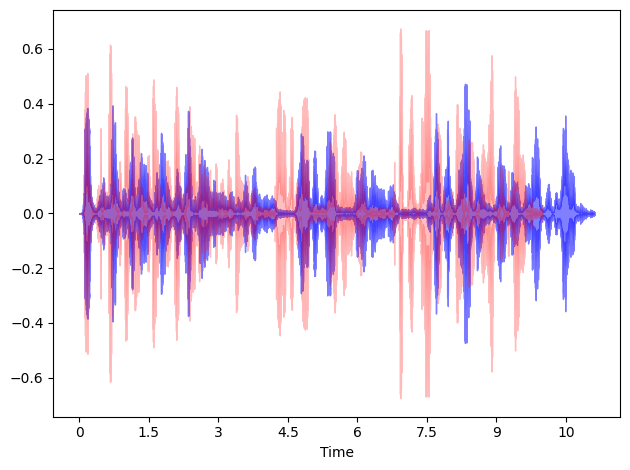

./datasets/KAGGLE/AUDIO/data_split/aug_real/linus-original_clip_0_speed_down_sample.wav


In [10]:
# speed down
speedAug = naa.SpeedAug(zone=(0,1), coverage=1, factor=(0.9, 0.9))
speed_down_audio = simulateAug(speedAug, audio, sr, 'speed')

# output_file = os.path.join(aug_real, f'{os.path.splitext(fileName)[0]}_speed_down_sample.wav')
# print(output_file)
# sf.write(output_file, np.ravel(speed_down_audio), sr)

In [276]:
y_fast = librosa.effects.time_stretch(audio, rate=1.005)
display('librosa_speed', ipd.Audio(y_fast, rate=sr))

'librosa_speed'

'origin'

'VTLP'

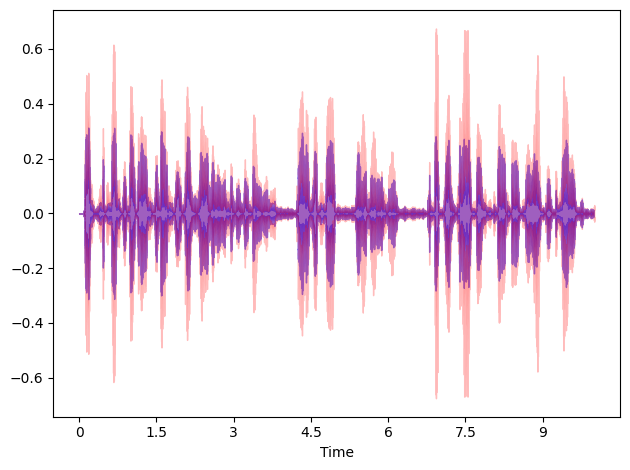

./datasets/KAGGLE/AUDIO/data_split/aug_fake/vtlp\linus-original_clip_0_vtlp_fake_sample.wav


In [357]:
# VTLP (Vocal Tract Length Perturbation)
vtlpAug = naa.VtlpAug(sampling_rate=sr, zone=(0.0, 1.0), coverage=1, factor=(1.003, 1.003))
augmented_vtlp_data = vtlpAug.augment(audio)
# AudioVisualizer.freq_power('VTLP Augmenter', audio, sr, augmented_vtlp_data)

# display('origin', ipd.Audio(audio, rate=sr))
# display('VTLP', ipd.Audio(augmented_vtlp_data, rate=sr))

simulateAug(vtlpAug, audio, sr, 'VTLP')

# output_file = os.path.join(aug_real, f'{os.path.splitext(fileName)[0]}_vtlp_fake_sample.wav')
# print(output_file)
# sf.write(output_file, np.ravel(augmented_vtlp_data), sr)

'origin'

'normalize'

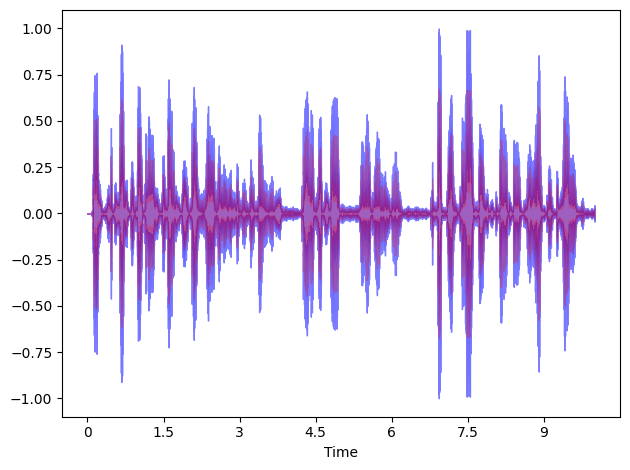

./datasets/KAGGLE/AUDIO/data_split/aug_fake/linus-original_clip_0_normalize_fake_sample.wav


In [382]:
# normalize 
normalizeAug = naa.NormalizeAug(method='minmax', zone=(0,1), coverage=1)
normalize_audio = simulateAug(normalizeAug, audio, sr, 'normalize')

# output_file = os.path.join(aug_fake, f'{os.path.splitext(fileName)[0]}_normalize_fake_sample.wav')
# print(output_file)
# sf.write(output_file, np.ravel(normalize_audio), sr)

'origin'

'polarity inversion'

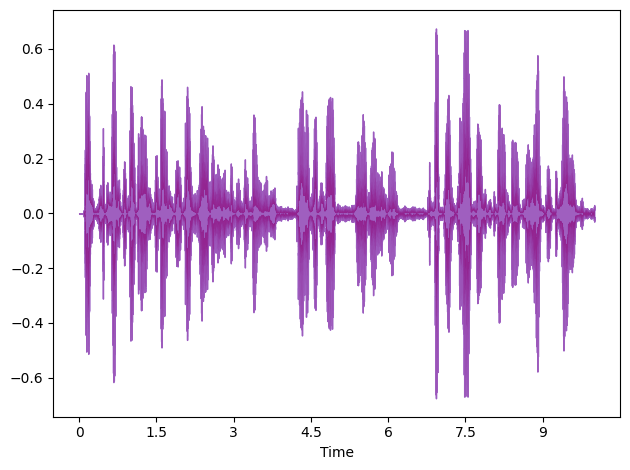

In [80]:
# polarity inversion 
polarityAug = naa.PolarityInverseAug()
simulateAug(polarityAug, audio, sr, 'polarity inversion')